# 其它操作

In [2]:
import os
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

import rarfile

from tqdm import tqdm
import json

In [3]:
def get_directories(path):
    return [d for d in os.listdir(path) if os.path.isdir(os.path.join(path, d))]
current_directory = os.getcwd()
directories = get_directories(current_directory)
print(directories)

['.nv', '.ipython', '.local', '.cache', '_public', '_shared', '.ipynb_checkpoints', '.npm', '.config', 'data', 'scikit_learn_data', 'lost+found', '.conda', 'my-conda-envs', '.jupyter', 'CrossPlatform']


In [4]:
# python解压.zip
# def unrar_file(rar_file, extract_to):
#     with rarfile.RarFile(rar_file, 'r') as rar_ref:
#         rar_ref.extractall(extract_to)

# 
# zip_file = '第一批交付数据_2024_0131.rar'
# extract_to = './data'

# unrar_file(zip_file, extract_to)


# 数据探索
1. 一行是一条推文的相关信息，字段包括：'tw_client', 'conversation_id', 'user_screen_name', 'name', 'user_id', 'user_id_str', 'source', 'user_avatar', 'status_type', 'created_ts', 'created_at', 'created_at_str', 'in_reply_to_status_id_str', 'retweeted_status_id_str', 'reply_count', 'retweet_count', 'favorite_count', 'text', 'time_save_db', 'user_mentions', 'a_hashtags', 'a_photo_medias', 'a_video_medias', 'photo_minio_path', 'vedio_minio_path', 'image_minio_path', 'a_urls', 'tweet_id', 'uuid', 'query', 'lasttime'

In [5]:
TWITTER_POST_PATH = "./data/2024_0131/Twitter/meibo.json"
post_all_data = []
with open(TWITTER_POST_PATH, 'r',encoding='utf-8') as file:
    lines = file.readlines()
    for line in tqdm(lines):
        data = json.loads(line)
        post_all_data.append(data)
print(len(post_all_data))

100%|██████████| 219035/219035 [00:10<00:00, 20254.46it/s]

219035


## 检查query的类别

In [6]:
query_dict = {}
for data in post_all_data:
    if data['query'] in query_dict:
        query_dict[data['query']].append(data)
    else:
        query_dict[data['query']] = [data]

In [7]:
query_dict.keys()

dict_keys(['U.S. Presidential Election', '美国总统选举', 'Election Updates', '选举动态', 'Political Campaigns', '政治竞选', 'Candidates', '候选人', 'Democratic Party', '民主党', 'Republican Party', '共和党', 'Political Debates', '政治辩论', 'Voter Registration', '选民登记', 'Voting Process', '选民投票过程', 'Polls and Surveys', '民意调查', 'Voting Rights', '选民权利', 'Nomination Campaigns', '提名竞选', 'Political Advertising', '政治广告', 'Voter Education', '选民教育', 'Voter Information', '选民信息', 'Campaign Events', '竞选活动', 'Political News', '政治新闻', 'Political Analysis', '政治分析', 'Election Predictions', '选举预测', 'Election Schedule', '选举日程', 'Early Voting', '早期投票', 'Mail', 'In Voting', '邮寄投票', 'Voter Intentions', '选民意向', 'Voter Trends', '选民趋势', 'Election Debates', '选举辩论', 'Election Committees', '选举委员会', 'Election Observation', '选举观察', 'Political Supporters', '政治支持者', 'Voter Turnout', '选民投票率', 'Political Parties', '政治党派', 'Political Participation', '政治参与', 'Political Donations', '政治捐赠', 'Voter Preferences', '选民偏好', 'Campaign Fundraising', '竞选筹款

### 挑选出日本核污水事件的query

In [8]:
water_key = ['福岛第一核电站', 'Fukushima Daiichi Nuclear Power Plant', '福島第一原子力発電所', 'Japan Nuclear Wastewater Discharge', '日本の核汚水排出事故', '核废水处理', 'Nuclear Wastewater Treatment', '核廃水処理', '放射性排放', 'Radioactive Emissions', '放射性排出', '核废水释放', 'Nuclear Wastewater Release', '核廃水放出', '环境保护', 'Environmental Protection', '環境保護', '辐射水污染', 'Radiation Water Contamination', '放射能水汚染', '核废水存储', 'Nuclear Wastewater Storage', '核廃水貯蔵', '放射性废料', 'Radioactive Waste', '放射性廃棄物', '核废水问题', 'Nuclear Wastewater Concerns', '核廃水の問題', '核污水处理技术', 'Nuclear Wastewater Treatment Technology', '核汚水処理技術', '环保组织', 'Environmental Organizations', '環境保護団体', '污水排放标准', 'Wastewater Discharge Standards', '核废水风险', 'Nuclear Wastewater Risks', '核廃水のリスク', '海洋生态系统', 'Marine Ecosystem', '海洋生態系', '污染影响', 'Pollution Effects', '汚染の影響', '核废水处置', 'Nuclear Wastewater Disposal', '辐射监测', 'Radiation Monitoring', '放射線モニタリング', '核废水决策', 'Nuclear Wastewater Decision', '核廃水に関する決定', '环境影响评估', 'Environmental Impact Assessment', '環境影響評価', '核废水处理方案', 'Nuclear Wastewater Disposal Plan', '核廃水処理計画', '污染清理', 'Pollution Cleanup', '汚染清掃', 'Radioactive Materials Release', '放射性物質の排出', '污水处理厂', 'Wastewater Treatment Plant', '汚水処理場', '生态平衡', 'Ecological Balance', '生態系のバランス', '核废水储存设施', 'Nuclear Wastewater Storage Facility', '核廃水貯蔵施設', '放射性废物处理', 'Radioactive Waste Handling', '放射性廃棄物の処理', '环保政策', 'Environmental Policies', '環境政策', '核污水监督', 'Nuclear Wastewater Oversight', '污染预防', 'Pollution Prevention', '汚染予防', '海洋生物影响', 'Marine Life Impact', '海洋生物への影響', '核废水安全', 'Nuclear Wastewater Safety', '核廃水の安全性', '放射性废料存储', 'Radioactive Waste Storage', '放射性廃棄物の貯蔵', '污染控制', 'Pollution Control', '汚染制御', '核废水解决方案', 'Nuclear Wastewater Solution', '核廃水の解決策', '核辐射风险', 'Nuclear Radiation Risk', '核放射線のリスク', '污染影响评估', 'Pollution Impact Assessment', '汚染影響評価', '海洋保护', 'Marine Conservation', '海洋保護', '核废水处理设备', 'Nuclear Wastewater Treatment Equipment', '核廃水処理設備', '放射性废物清理', 'Radioactive Waste Cleanup', '放射性廃棄物の清掃', '污染监测', 'Pollution Monitoring', '汚染モニタリング', '核污水', 'Nuclear Wastewater', '核廃水', '处理水', 'Treated Water', '処理水', '放射性物质', 'Radioactive Substances', '放射性物質', '东京电力公司', 'Tokyo Electric Power Company (TEPCO)', '東京電力', '海洋排放', 'Ocean Discharge', '海洋放出', '国际原子能机构', 'International Atomic Energy Agency (IAEA)', '国際原子力機関', '核事故', 'Nuclear Accident', '原子力事故', '核安全', 'Nuclear Safety', '原子力安全', '核废料', 'Nuclear Waste']

len_water = 0
for key in water_key:
    print(key, len(query_dict[key]))
    len_water += len(query_dict[key])
print(len_water)

福岛第一核电站 472
Fukushima Daiichi Nuclear Power Plant 143
福島第一原子力発電所 183
Japan Nuclear Wastewater Discharge 75
日本の核汚水排出事故 3
核废水处理 93
Nuclear Wastewater Treatment 84
核廃水処理 284
放射性排放 71
Radioactive Emissions 102
放射性排出 92
核废水释放 70
Nuclear Wastewater Release 77
核廃水放出 73
环境保护 637
Environmental Protection 725
環境保護 891
辐射水污染 4
Radiation Water Contamination 81
放射能水汚染 179
核废水存储 53
Nuclear Wastewater Storage 64
核廃水貯蔵 20
放射性废料 145
Radioactive Waste 245
放射性廃棄物 226
核废水问题 124
Nuclear Wastewater Concerns 140
核廃水の問題 68
核污水处理技术 157
Nuclear Wastewater Treatment Technology 18
核汚水処理技術 15
环保组织 342
Environmental Organizations 220
環境保護団体 321
污水排放标准 96
Wastewater Discharge Standards 117
核废水风险 36
Nuclear Wastewater Risks 86
核廃水のリスク 23
海洋生态系统 190
Marine Ecosystem 190
海洋生態系 84
污染影响 153
Pollution Effects 187
汚染の影響 164
核废水处置 104
Nuclear Wastewater Disposal 32
辐射监测 73
Radiation Monitoring 86
放射線モニタリング 166
核废水决策 60
Nuclear Wastewater Decision 69
核廃水に関する決定 11
环境影响评估 111
Environmental Impact Assessment 137
環境影響評価 225
核废水处

### 挑选出污水处理的帖子

In [9]:
water_post = []
for key in water_key:
    water_post += query_dict[key]
print(len(water_post))

24491


#### 查看语言分布

In [11]:
# 语言检测
from langdetect import detect
water_lang_dict = {}
for post in tqdm(water_post):
    try:
        lang = detect(post['text'])
        if lang in water_lang_dict:
            water_lang_dict[lang].append(post)
        else:
            water_lang_dict[lang] = [post]
    except:
        print(post['text'])

  2%|▏         | 591/24491 [00:01<00:58, 406.60it/s]

https://t.co/iHrw3vVNE9


  7%|▋         | 1773/24491 [00:04<00:49, 456.01it/s]

https://t.co/UM8A9nomgs


 12%|█▏        | 2946/24491 [00:07<01:13, 292.99it/s]

https://t.co/rSYPc3CdcT


 41%|████      | 10003/24491 [00:23<00:30, 474.42it/s]

https://t.co/tIa4J91DGd


 44%|████▎     | 10713/24491 [00:25<00:28, 491.85it/s]

https://t.co/ZzmmW19DU9


 56%|█████▌    | 13700/24491 [00:32<00:35, 307.22it/s]

https://t.co/wncIoB2NWi


 56%|█████▋    | 13805/24491 [00:33<00:25, 411.34it/s]

2/2 https://t.co/umRwWzubqs


 62%|██████▏   | 15259/24491 [00:36<00:23, 388.00it/s]

https://t.co/UM8A9nomgs


 77%|███████▋  | 18966/24491 [00:43<00:09, 581.41it/s]

☢️


 79%|███████▉  | 19379/24491 [00:44<00:11, 453.24it/s]

https://t.co/FWByBK2Wta


 97%|█████████▋| 23695/24491 [00:53<00:02, 348.26it/s]

https://t.co/mXcZkQqcU1


 98%|█████████▊| 23935/24491 [00:53<00:01, 327.62it/s]

鳄鳄😭😭 https://t.co/sDoxSg336s


100%|██████████| 24491/24491 [00:55<00:00, 440.27it/s]


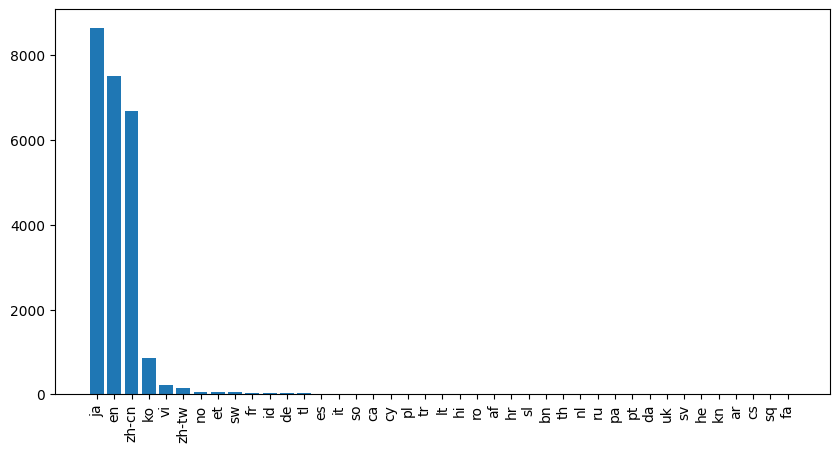

In [14]:
# 语言分布可视化
lang_count = []
for lang in water_lang_dict:
    lang_count.append((lang, len(water_lang_dict[lang])))
lang_count = sorted(lang_count, key=lambda x: x[1], reverse=True)
plt.figure(figsize=(10, 5))
plt.bar([x[0] for x in lang_count], [x[1] for x in lang_count])
# 90
plt.xticks(rotation=90)

plt.show()

In [17]:
water_lang_dict['en'][0]

{'tw_client': '',
 'conversation_id': '1734159035514196447',
 'user_screen_name': 'miren_41319',
 'name': '迷人的小红',
 'user_id': 1167765353415487488,
 'user_id_str': '1167765353415487488',
 'source': '',
 'user_avatar': 'https://pbs.twimg.com/profile_images/1396714942443655170/UO8JduEC_normal.jpg',
 'status_type': 1,
 'created_ts': 1702290707,
 'created_at': 1702290707000,
 'created_at_str': 'Mon Dec 11 10:31:47 +0000 2023',
 'in_reply_to_status_id_str': '',
 'retweeted_status_id_str': '',
 'reply_count': 19,
 'retweet_count': 5,
 'favorite_count': 83,
 'text': '突发！日本福岛第一核电站2号机组进行废炉作业的工作人员被核辐射😓😓😓\n\n岸田文胸会不会鞠躬？\nNuclear radiation in Japan',
 'time_save_db': 1706118160467,
 'user_mentions': None,
 'a_hashtags': [],
 'a_photo_medias': [],
 'a_video_medias': [],
 'photo_minio_path': [],
 'vedio_minio_path': [],
 'image_minio_path': '',
 'a_urls': [],
 'tweet_id': '1734159035514196447',
 'uuid': '1734159035514196447_福岛第一核电站',
 'query': '福岛第一核电站',
 'lasttime': 1706118161930}

#### 查看时间分布

In [31]:
# 时间分布,created_ts字段为unix时间戳
from datetime import datetime
time_count = {}
for post in tqdm(water_post):
    time = datetime.utcfromtimestamp(post['created_ts']).strftime('%Y-%m-%d')
    if time in time_count:
        time_count[time] += 1
    else:
        time_count[time] = 1

100%|██████████| 24491/24491 [00:00<00:00, 355328.75it/s]


In [32]:
time_count.keys()

dict_keys(['2023-09-05', '2023-12-21', '2023-11-24', '2023-11-23', '2023-10-05', '2023-12-18', '2023-12-11', '2023-11-22', '2023-11-21', '2023-11-20', '2023-11-19', '2023-12-17', '2023-12-14', '2023-08-29', '2023-12-19', '2023-11-16', '2023-11-01', '2023-11-06', '2023-12-20', '2023-12-12', '2023-12-08', '2023-09-06', '2023-10-30', '2023-11-03', '2022-07-13', '2023-05-31', '2022-05-20', '2023-01-18', '2022-03-20', '2022-07-22', '2023-06-28', '2023-05-08', '2023-06-05', '2023-08-30', '2023-09-04', '2023-08-22', '2023-08-21', '2021-07-09', '2023-08-27', '2021-04-20', '2024-01-02', '2023-12-30', '2024-01-25', '2023-08-31', '2022-06-29', '2023-09-26', '2023-09-29', '2023-04-05', '2023-09-20', '2022-03-22', '2021-04-16', '2022-03-11', '2023-09-03', '2023-11-25', '2023-08-25', '2023-11-12', '2023-10-11', '2023-08-26', '2023-06-15', '2023-10-04', '2023-08-16', '2023-04-03', '2023-09-30', '2023-09-19', '2023-12-16', '2023-09-15', '2022-08-04', '2023-03-29', '2021-03-01', '2021-03-11', '2023-06-

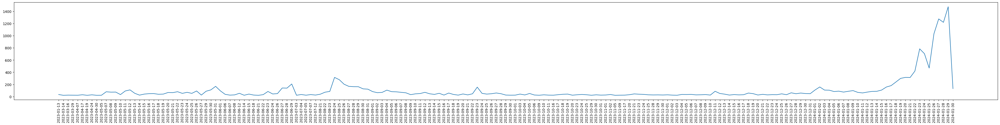

In [42]:
# 时间分布可视化
# 首先去除2023年之前的数据
time_count_data = {k: v for k, v in time_count.items() if k > '2023-01-01' and v > 20}
time_count_data = sorted(time_count_data .items(), key=lambda x: x[0])
plt.figure(figsize=(50, 5))
plt.plot([x[0] for x in time_count_data], [x[1] for x in time_count_data])
# 90
plt.xticks(rotation=90)
plt.show()

Candidates 1201
候选人 9769
Democratic Party 2363
民主党 24279
Republican Party 2542
共和党 20213
民意调查 1590
Mail 13602
In Voting 1006
美国政治 1900
政治改革 1391
调查结果 1844
Civil Rights 1180
民权 1530
primary election 1235
Donald Trump 33545
Joe Biden 28174
Nikki Haley 2939
美国参议员 8792
前国务卿 1369
処理水 2263


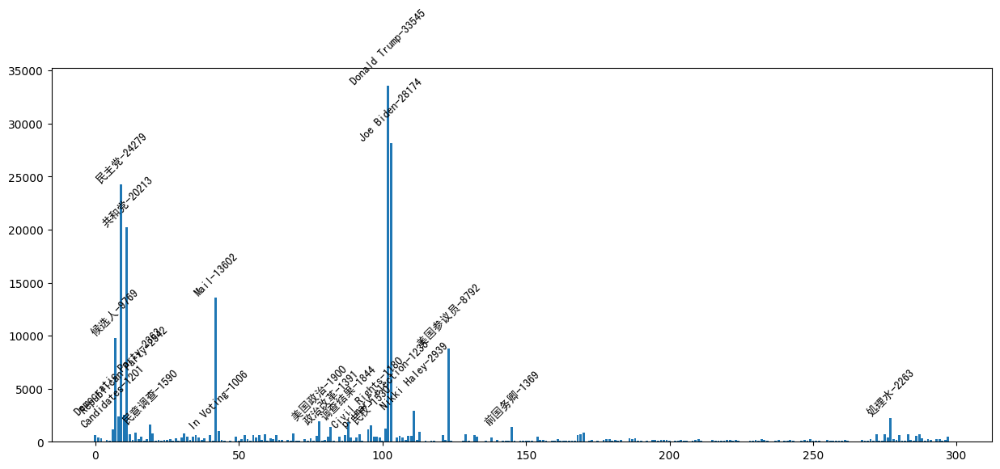

In [9]:
# 可视化query_dict
from matplotlib.font_manager import FontProperties
my_font = FontProperties(fname="./SimHei.ttf", size=12)

plt.figure(figsize=(15, 6))
query_count = {}
for query, data in query_dict.items():
    query_count[query] = len(data)
indexes = range(len(query_count))
plt.bar(indexes, query_count.values())

# 找出其中大于1000的query，并且标注在图上
for query, count in query_count.items():
    if count > 1000:
        print(query, count)
        idx = list(query_count.keys()).index(query)
        plt.text(idx, count, f"{query}-{count}", ha='center', va='bottom', fontsize=10, rotation=45, fontproperties=my_font)
plt.show()


## 读取语言分类后的数据

In [44]:
# 读取lang_distribution.json
import json
with open('./data/2024_0131/Twitter/lang_distribution.json', 'r',encoding='utf-8') as f:
    lang_dict = json.load(f)
# 统计每个语言的数量
lang_count = {}
for key in lang_dict:
    lang_count[key] = len(lang_dict[key])


en 110455
ja 21557
zh 81187


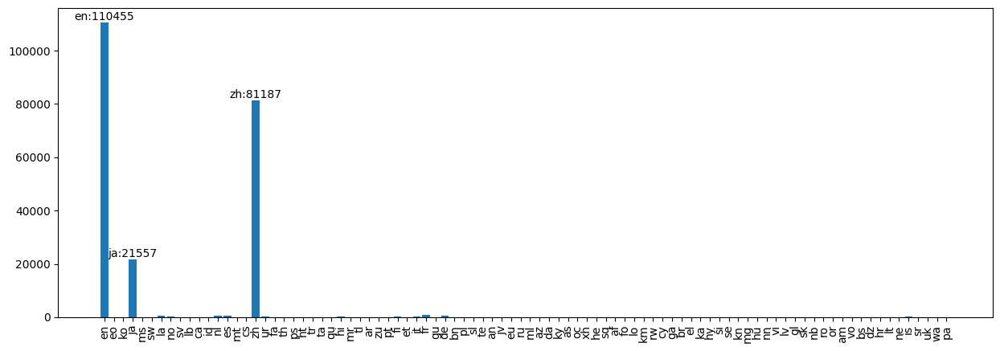

In [45]:
# 可视化lang_dist
import matplotlib.pyplot as plt
import numpy as np
plt.figure(figsize=(15, 5))
plt.bar(lang_count.keys(), lang_count.values())
plt.xticks(rotation=90)
# 找出大于1000的语言
for lang, count in lang_count.items():
    if count > 1000:
        print(lang, count)
        plt.text(lang, count, f"{lang}:{count}", ha='center', va='bottom', fontsize=10)
plt.show()

## 用户信息
1. 这里`user_screen_name`是key

In [14]:
# 构造user_dict
user_dict = {}
for data in post_all_data:
    user = data['user_id']
    if user in user_dict:
        user_dict[user].append(data)
    else:
        user_dict[user] = [data]

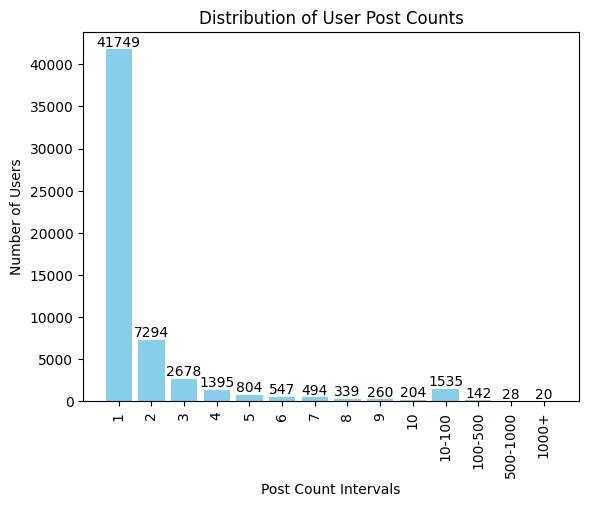

In [15]:
# 统计每个用户的发帖数量,并可视化
user_count = {}
for key in user_dict:
    user_count[key] = len(user_dict[key])
user_count = dict(sorted(user_count.items(), key=lambda x: x[1], reverse=True))

interval_counts = {
    '1': 0,
    '2': 0,
    '3': 0,
    '4': 0,
    '5': 0,
    '6': 0,
    '7': 0,
    '8': 0,
    '9': 0,
    '10': 0,
    '10-100': 0,
    '100-500':0,
    '500-1000':0,
    '1000+':0
}
for count in user_count.values():
    if count <= 10:
        interval_counts[str(count)] += 1
    elif count <= 100:
        interval_counts['10-100'] += 1
    elif count <= 500:
        interval_counts['100-500'] += 1
    elif count <= 1000:
        interval_counts['500-1000'] += 1
    else:
        interval_counts['1000+'] += 1

# 可视化
plt.bar(interval_counts.keys(), interval_counts.values(),color='skyblue')
for k, v in interval_counts.items():
    plt.text(k, v, v, ha='center', va='bottom', fontsize=10)

plt.xlabel('Post Count Intervals')
plt.ylabel('Number of Users')
plt.title('Distribution of User Post Counts')
plt.xticks(rotation=90)
plt.show()


[13850422, 116128726, 51241574, 56572394, 39941478, 2836421, 34713362, 1652541, 2884771, 1279623977330184194, 8149482, 807095, 2467791, 16666806, 8151462, 198739343, 759251, 15012486, 1967232710, 2612890274, 91478624, 5988062, 2574169418, 28785486, 2790042071, 15754281, 427831052, 2169963714, 3108351, 21856182, 1305905708018348032, 18526305, 19489239, 335606210, 380648579, 143810986, 588261604, 711760467383877632, 46574977, 975002713485328386, 14293310, 1367531, 847450162855264262, 22240612, 87818409, 365886581, 1273811167065055232, 14173315, 33399787, 32201814, 1917731, 44628277, 4970411, 82299136, 1005889483793842176, 17595489, 767144354, 1092378031, 620632841, 1027764083565711360, 240265305, 20845447, 1262412296187494400, 864521635260506112, 126798663, 1335493192783777793, 3091150576, 9609582, 25067314, 6134882]
['CNN Politics', '阿波罗网唯一官方推号', 'The Associated Press', '大纪元新闻网', '联合早报 Lianhe Zaobao', 'MSNBC', 'Bloomberg', 'Reuters', 'Newsweek', '全媒体财经俱乐部', '美国之音中文网', 'The New York Time

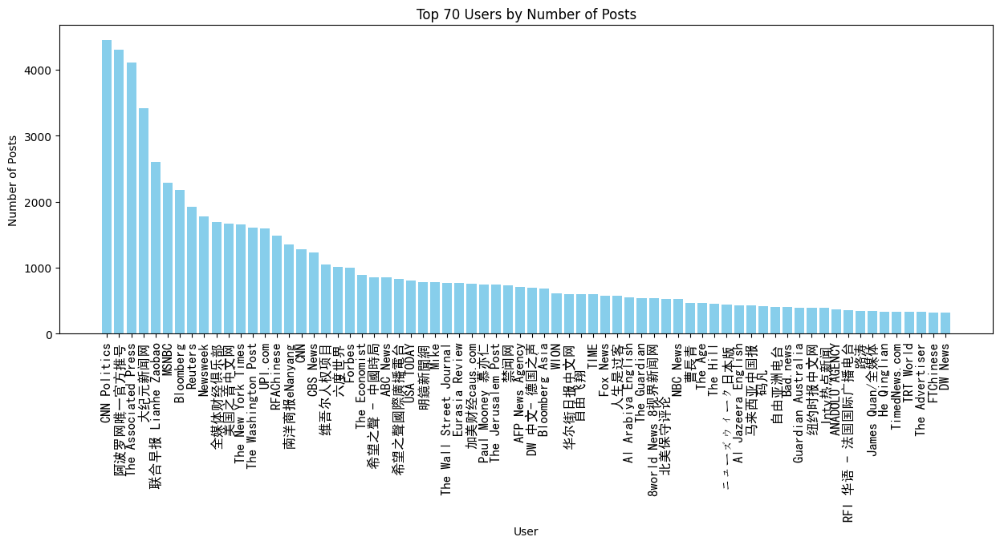

In [17]:
# 获取前十个用户和其对应的发帖数量
# 不要显示UserWarning
import warnings
warnings.filterwarnings("ignore")

select_num = 70
top_select_users = list(user_count.keys())[:select_num]
print(top_select_users)
top_select_counts = list(user_count.values())[:select_num]
user_names = []
# 可视化用户与发帖数量的关系
for user_id in top_select_users:
    user_name = user_dict[user_id][0]['name']
    user_names.append(user_name)
print(user_names)
plt.figure(figsize=(15, 5))
plt.bar(range(select_num), top_select_counts, color='skyblue')
plt.xlabel('User')
plt.ylabel('Number of Posts')
# # 重新设置X轴标签的名称
my_font = FontProperties(fname="./SimHei.ttf", size=12)
plt.xticks(range(select_num), user_names, fontproperties=my_font)
plt.title(f'Top {select_num} Users by Number of Posts')
plt.xticks(rotation=90) 
plt.show()


### 一些用户的具体分析？
一个思路是，通过大V在微博的号去查，但是显然只能找`红方`的账号


| 序号 | 用户名           | 用户ID               | 昵称   |
|------|-----------------|----------------------|--------|
| 1    | whyyoutouzhele  | 1260553941714186241  | 李老师 |
| 2    | wangzhian8848   | 1072109417200414720  | 王局   |
| 3    | lidangzzz       | 28940967              | lidang |
| 4    | torontobigface  | 1477342523555135490  | 方脸   |
| 5    | miren_41319     | 1167765353415487488  | 小红   |
| 6    | guyanmuchan001  | 1376469670874640386  | 孤烟暮蝉 |
| 7    | leige88888      | 147929555             | 磊哥聊财经 |


In [38]:
for data in post_all_data:
    if data['user_screen_name'] == 'mortalman123':
        print(data)
        break

In [36]:
# 查找王局的帖子
wangju_posts = user_dict[147929555]
for data in wangju_posts:
    print(data['text'])
    print('---')


🔺美国加利福尼亚州州长纽森访问中国，受到中方超规格接待，纽森去了好多城市，从香港一路往北，访问了深圳上海北京，去看了深圳地铁，比亚迪汽车，还试乘了仰望，他还说想买两辆，这是给BYD打了一个不错的广告，当然咱们这边也没含糊，各地市长接待，王毅也见到了，甚至还见到了国家领导人。纽森其实… https://t.co/Kdjl7IXtiT
---
10月28日，在盐城考察的美国加利福尼亚州州长纽森看到当地的自然景色后，纽森说这里比他家乡的景色更胜一筹。他和夫人还在自然保护区里在饲养员的指导下给丹顶鹤喂食 https://t.co/AMXGtp9msd
---
东电方面承认，目前储罐中约有66%的核污染水放射性物质含量超标。在被问及核污染水何时能够全部排完时，东电危机公关负责人竟然称，究竟何时能够全部排完核污染水，东电目前并没有任何具体计划。作为排海计划的实施方，东京电力公司这样的回答也让排海计划更加令人难以信服。 https://t.co/ZjLF1DY3sM
---
福岛县自己的数据，胃癌，甲状腺癌的发病率从福岛核事故后长期居高不下 https://t.co/O1XoW4VdqD
---


## 转评赞分析
1. 转评赞key为`reply_count`,`retweet_count`,`favorite_count`


In [46]:
hot_count = {}
idx = 0
for data in tqdm(post_all_data):
    hot_num = 0
    hot_num += data['reply_count']
    hot_num += data['retweet_count']
    hot_num += data['favorite_count']
    hot_count[idx] = hot_num
    idx += 1


100%|██████████| 219035/219035 [00:00<00:00, 357909.54it/s]


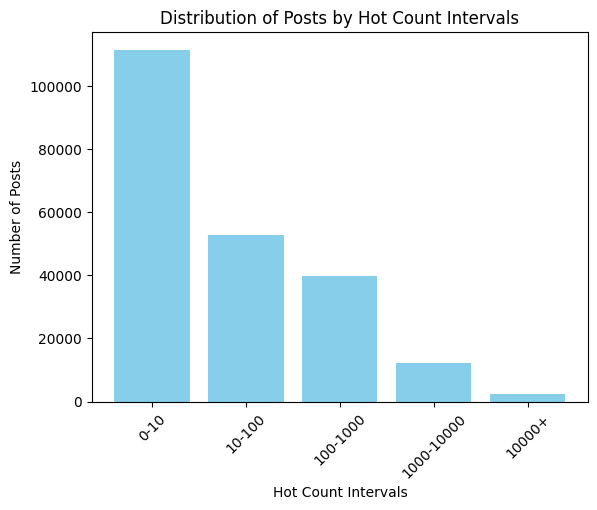

In [55]:
import heapq
top_num = 10
top_hot_posts = heapq.nlargest(top_num, hot_count, key=hot_count.get)
# 可视化
# for idx in top_hot_posts:
#     data = post_all_data[idx]
#     print(data['text'])
#     print(f"reply_count:{data['reply_count']}, retweet_count:{data['retweet_count']}, favorite_count:{data['favorite_count']}")
#     print(f"name:{data['name']}")
#     print('---')
# 初始化区间统计字典
interval_counts = {
    '0-10': 0,
    '10-100': 0,
    '100-1000': 0,
    '1000-10000': 0,
    '10000+': 0
}

for count in hot_count.values():
    if count <= 10:
        interval_counts['0-10'] += 1
    elif 10 < count <= 100:
        interval_counts['10-100'] += 1
    elif 100 < count <= 1000:
        interval_counts['100-1000'] += 1
    elif 1000 < count <= 10000:
        interval_counts['1000-10000'] += 1
    else:
        interval_counts['10000+'] += 1

# 可视化区间统计结果
plt.bar(interval_counts.keys(), interval_counts.values(), color='skyblue')
plt.xlabel('Hot Count Intervals')
plt.ylabel('Number of Posts')
plt.title('Distribution of Posts by Hot Count Intervals')
plt.xticks(rotation=45)  
plt.show()




---
# 以下内容为无效内容，Bertopic详见

# Bertopic

## 处理中文语料

### 直接对中文进行分类

In [46]:
# 取出其中的中文
chinese_lang = lang_dict['zh']
print(len(chinese_lang))

81187


In [15]:
chinese_lang[0]

{'tw_client': '',
 'conversation_id': '1749973312779010271',
 'user_screen_name': 'SongH3086',
 'name': '宋小华（互FO必回）',
 'user_id': 1697924863003090944,
 'user_id_str': '1697924863003090944',
 'source': '',
 'user_avatar': 'https://pbs.twimg.com/profile_images/1697925076019281920/LjP2G0-j_normal.jpg',
 'status_type': 1,
 'created_ts': 1706061125,
 'created_at': 1706061125000,
 'created_at_str': 'Wed Jan 24 01:52:05 +0000 2024',
 'in_reply_to_status_id_str': '',
 'retweeted_status_id_str': '',
 'reply_count': 0,
 'retweet_count': 0,
 'favorite_count': 1,
 'text': '当地时间23日20时，在新罕布什尔州举行的2024年美国总统选举共和党初选投票已结束，美联社等多家媒体随即预测特朗普胜选。',
 'time_save_db': 1706083539869,
 'user_mentions': None,
 'a_hashtags': [],
 'a_photo_medias': [],
 'a_video_medias': [],
 'photo_minio_path': [],
 'vedio_minio_path': [],
 'image_minio_path': '',
 'a_urls': [],
 'tweet_id': '1749973312779010271',
 'uuid': '1749973312779010271_美国总统选举',
 'query': '美国总统选举',
 'lasttime': 1706083539817}

In [29]:
from bertopic import BERTopic
topic_model = BERTopic(language="chinese (simplified)",verbose=True)

In [30]:
docs = [data['text'] for data in chinese_lang]
docs[0]

'当地时间23日20时，在新罕布什尔州举行的2024年美国总统选举共和党初选投票已结束，美联社等多家媒体随即预测特朗普胜选。'

In [31]:
topics, probs = topic_model.fit_transform(docs)


2024-02-23 22:34:22,391 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/2538 [00:00<?, ?it/s]

2024-02-23 22:35:50,252 - BERTopic - Embedding - Completed ✓
2024-02-23 22:35:50,255 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-02-23 22:52:14,942 - BERTopic - Dimensionality - Completed ✓
2024-02-23 22:52:14,948 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current p

In [32]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,23548,-1_禁闻网_民主党_民主_via,"[禁闻网, 民主党, 民主, via, 中期选举, 爆料aboluobl, com, 特朗普...",[美国参议员罗恩-约翰逊2月1日致信国防部长劳埃德-奥斯汀，强调在疫苗向军队推广后，国防医学...
1,0,724,0_左右问题_哈粉伊粉反诬反咬_胡平不懂自由平等等价值观本质_支黑逆种族主义脑残标兵,"[左右问题, 哈粉伊粉反诬反咬, 胡平不懂自由平等等价值观本质, 支黑逆种族主义脑残标兵, ...",[支黑逆种族主义脑残标兵；马列教阶级解放民族解放伊斯兰解放反人类理论危害，哈粉伊粉反诬反咬；...
2,1,714,1_zugwdikjwi_baoliaogeming64_而是内容极为翔实的329页病毒报告...,"[zugwdikjwi, baoliaogeming64, 而是内容极为翔实的329页病毒报...",[RT @Baoliaogeming64: 关于病毒溯源报告，其实美国参议员卢比奥发布的，最...
3,2,596,2_donald_前总统_川普_trump,"[donald, 前总统, 川普, trump, nyy3rekoda, 阿波罗网编译, l...",[RT @ChooLucia: 川普总统紧急呼吁‼️\n\n这是今年最大的新闻，共和党人必须...
4,3,565,3_今日中国报_ge15_全国大选_pru15,"[今日中国报, ge15, 全国大选, pru15, 中国报, 6州选举, election...",[卫生部前部长凯利说，民主行动党白沙罗前国会议员潘俭伟把国阵形容为“贪污联盟”的言论，或造成...
...,...,...,...,...,...
1538,1537,10,1537_2021年国民动物保护认知调查结果显示_韩饲养伴侣犬猫家庭月均饲养费为15万和13...,"[2021年国民动物保护认知调查结果显示, 韩饲养伴侣犬猫家庭月均饲养费为15万和13万韩元...",[@32bn31bde @sugela81192 @guyanmuchan001 你是日本人...
1539,1538,10,1538_出来了一些东西_共和党地区检察官正在准备起诉拜登家族_乔丹提供了两项主要调查的最新...,"[出来了一些东西, 共和党地区检察官正在准备起诉拜登家族, 乔丹提供了两项主要调查的最新进展...",[RT @NAConservative9: 《“出来了一些东西”：乔丹提供了两项主要调查的最...
1540,1539,10,1539_前国务卿蓬佩奥发表致中国人民视频讲话第三集_中共是美中关系恶化终极原因_的视频中说...,"[前国务卿蓬佩奥发表致中国人民视频讲话第三集, 中共是美中关系恶化终极原因, 的视频中说, ...",[前国务卿蓬佩奥发表致中国人民视频讲话第三集：中共是美中关系恶化终极原因 https://t...
1541,1540,10,1540_彭斯促共和党人停止攻击fbi_共和党议员希望司法部对取消抓捕中共间谍的计划做出解释...,"[彭斯促共和党人停止攻击fbi, 共和党议员希望司法部对取消抓捕中共间谍的计划做出解释, 彭...",[彭斯要求共和党停止攻击FBI，并表示：J6委员会如果邀请他出庭作证，他会考虑\nhttps...


In [38]:
import langid
zh_topic = []
for query_dict_key in query_dict:
    detect_lang = langid.classify(query_dict_key)
    if detect_lang[0] == 'zh':
        zh_topic.append(query_dict_key)
print(len(zh_topic))

168


### 按照query的数量减少分类结果

In [41]:
topic_model.reduce_topics(docs, nr_topics=200)

2024-02-23 23:05:05,349 - BERTopic - Topic reduction - Reducing number of topics
2024-02-23 23:05:05,351 - BERTopic - Topic reduction - Reduced number of topics from 200 to 200


In [42]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,23548,-1_co_https_rt_禁闻网,"[co, https, rt, 禁闻网, youtube, via, 民主党, 川普, 共和...",[RT @LongGaoyu: 美国参议员致信白宫&lt;br&gt;要求拜登谴责中共迫害法...
1,0,4863,0_六四_42名美国参议员警告中国不要暴力镇压抗议活动_3fzcsxhsea_胡平,"[六四, 42名美国参议员警告中国不要暴力镇压抗议活动, 3fzcsxhsea, 胡平, 后...",[胡平：民主与专制的终极之战: “六四”不但中断了中国的政治改革，而且它也把中国的经济改革引...
2,1,4553,1_br_美国参议员致信白宫_456641_要求拜登谴责中共迫害法轮功,"[br, 美国参议员致信白宫, 456641, 要求拜登谴责中共迫害法轮功, jrjlsbo...",[RT @LongGaoyu: 美国参议员致信白宫&lt;br&gt;要求拜登谴责中共迫害法...
3,2,3334,2_摆了一道_美参院共和党人提案_禁止所有中共党员取得赴美旅游签证_voachinese,"[摆了一道, 美参院共和党人提案, 禁止所有中共党员取得赴美旅游签证, voachinese...",[颜纯钩：郭台铭被“摆了一道”侯友宜确没有总统相(图): 早前，国民党终于宣布“征召”侯友宜...
4,3,3243,3_今日中国报_ri6esgrnxu_为陷入困境的共和党注入活力_nj9mtkx20h,"[今日中国报, ri6esgrnxu, 为陷入困境的共和党注入活力, nj9mtkx20h,...",[棒球传奇人物史蒂夫加维考虑美国参议院在加利福尼亚州的竞标，为陷入困境的共和党注入活力 ht...
...,...,...,...,...,...
195,194,11,194_10k0unaxa0_据2019年中国精神障碍流行病学调查结果显示_vtpshksq...,"[10k0unaxa0, 据2019年中国精神障碍流行病学调查结果显示, vtpshksqh...",[算我服了你了，请你不要再爆典了好不好，这么张口就来太无知了😒\n--------\n据20...
196,195,11,195_川普周一推出新网站https_该网曾是他竞选活动主要网站_致力于保留川普政府遗产和总...,"[川普周一推出新网站https, 该网曾是他竞选活动主要网站, 致力于保留川普政府遗产和总统...",[RT @Rengongmeng: 川普周一推出新网站https://t.co/H5DVn9...
197,196,11,196_ucp谈论减少暴力犯罪_艾伯塔省新民主党在卡尔加里举行集会_yikynkf1s4_i...,"[ucp谈论减少暴力犯罪, 艾伯塔省新民主党在卡尔加里举行集会, yikynkf1s4, i...",[艾伯塔省新民主党在卡尔加里举行集会，UCP谈论减少暴力犯罪 https://t.co/yI...
198,197,11,197_共和党两党不吵了_的难民空运到乌克兰_热点民主国家争相聘请_建议把所有非法进入美国,"[共和党两党不吵了, 的难民空运到乌克兰, 热点民主国家争相聘请, 建议把所有非法进入美国,...",[@NikkiHaley 建议把所有非法进入美国🇺🇸加拿大🇨🇦的难民空运到乌克兰，参加反俄罗...


In [43]:
topic_model.visualize_topics()

### 按照query进行半监督学习

In [46]:
category = []
for data in chinese_lang:
    if data['query'] in zh_topic:
        category.append(zh_topic.index(data['query']))
    else:
        category.append(-1)

<BarContainer object of 158 artists>

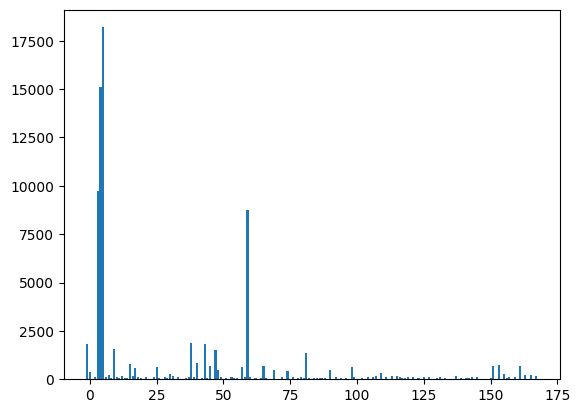

In [49]:
# 统计每个类别的数量并可视化
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter
category_count = Counter(category)
category_count = dict(category_count)
category_count = dict(sorted(category_count.items(), key=lambda item: item[1], reverse=True))
category_count  
plt.bar(category_count.keys(), category_count.values())

In [58]:
# 找到最大的类别
max_category = max(category_count, key=category_count.get)
print(f"max_category: {max_category}, count: {category_count[max_category]}, topic: {zh_topic[max_category]}")
    

max_category: 5, count: 18193, topic: 共和党


## 处理英文语料

### 数据预处理

In [47]:
en_data = lang_dict['en']
print(len(en_data))

110455


In [48]:
import re
def remove_newlines(text):
    # 将换行符替换为空格
    clean_text = text.replace('\n', ' ')
    return clean_text
def remove_urls(text):
    url_pattern = re.compile(r'https?://\S+|www\.\S+')
    # 将匹配到的网址替换为空字符串
    clean_text = url_pattern.sub('', text)
    return clean_text
def remove_after_at(text):
    # 匹配@符号后面的单词的正则表达式
    after_at_pattern = re.compile(r'@\w+\s?')
    clean_text = after_at_pattern.sub('', text)
    return clean_text

In [49]:
idx = 0
for data in en_data:
    original_text = remove_newlines(data['text'])
    # print(f"original text: {original_text}")
    remove_url = remove_urls(original_text)
    # print(f"remove url: {remove_url}")
    remove_after = remove_after_at(remove_url)
    # print(f"remove after at: {remove_after}")
    # print()
    en_data[idx]['text'] = remove_after
    idx += 1
docs = [data['text'] for data in en_data]

### 对英文文本进行聚类

In [82]:
topic_model_en = BERTopic(language="english",verbose=True)

topics, probs = topic_model_en.fit_transform(docs)

2024-02-23 23:33:25,045 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/3452 [00:00<?, ?it/s]

2024-02-23 23:34:15,538 - BERTopic - Embedding - Completed ✓
2024-02-23 23:34:15,540 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-02-24 00:17:48,252 - BERTopic - Dimensionality - Completed ✓
2024-02-24 00:17:48,259 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current p

In [43]:
# 读取
from bertopic import BERTopic
topic_model_en = BERTopic.load("en_model")

In [50]:
topic_model_en.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,35425,-1_you_political_we_they,"[you, political, we, they, not, your, this, it...",[Donald Trump was called to the stand Thursday...
1,0,1597,0_waste_radioactive_nuclear_radiation,"[waste, radioactive, nuclear, radiation, energ...","[Nuclear waste, Nuclear waste., nuclear waste...]"
2,1,1026,1_border_immigration_migrants_illegal,"[border, immigration, migrants, illegal, mexic...",[Donald Trump: Border Bill Isn't Designed to...
3,2,604,2_wastewater_fukushima_japans_japan,"[wastewater, fukushima, japans, japan, dischar...",[#Japan started releasing nuclear-contaminated...
4,3,561,3_reform_labour_tory_tories,"[reform, labour, tory, tories, snp, ukip, tice...",[Labour &amp; the Tories are actual registered...
...,...,...,...,...,...
1777,1776,10,1776_phone_icy_counterpart_hoped,"[phone, icy, counterpart, hoped, call, jinping...",[President Joe Biden is planning to hold a pho...
1778,1777,10,1777_833_ordered_mil_83m,"[833, ordered, mil, 83m, 877500, 220m, pay, le...",[Donald Trump has been ordered to pay $83m in ...
1779,1778,10,1778_brooks_mo_alabama_britt,"[brooks, mo, alabama, britt, endorsement, kati...",['You just blew the Election': Donald Trump wi...
1780,1779,10,1779_lasso_teaming_mental_coach,"[lasso, teaming, mental, coach, ted, televisio...",[Ted Lasso and President Joe Biden are teaming...


In [20]:
import langid
en_topic = []

for query_dict_key in query_dict:
    detect_lang = langid.classify(query_dict_key)
    if detect_lang[0] == 'en':
        en_topic.append(query_dict_key)
        if query_dict_key in en_topic_dict:
            en_topic_dict[query_dict_key] += 1
        else:
            en_topic_dict[query_dict_key] = 1
print(len(en_topic))

93


In [23]:
# 统计每个类别的数量并可视化，en_topic_dict
en_topic_dict = {}
for data in en_data:
    if data['query'] in en_topic:
        if data['query'] in en_topic_dict:
            en_topic_dict[data['query']] += 1
        else:
            en_topic_dict[data['query']] = 1


([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64,
  65,
  66,
  67,
  68,
  69,
  70,
  71,
  72,
  73,
  74,
  75,
  76,
  77,
  78,
  79,
  80,
  81,
  82,
  83,
  84,
  85,
  86,
  87,
  88,
  89,
  90,
  91,
  92],
 [Text(0, 0, 'Donald Trump'),
  Text(1, 0, 'Joe Biden'),
  Text(2, 0, 'Mail'),
  Text(3, 0, 'Republican Party'),
  Text(4, 0, 'Democratic Party'),
  Text(5, 0, 'primary election'),
  Text(6, 0, 'Candidates'),
  Text(7, 0, 'Voter Registration'),
  Text(8, 0, 'Political Opinion'),
  Text(9, 0, 'Voting Rights'),
  Text(10, 0, 'Political Debates'),
  Text(11, 0, 'Political Donations'),
  Text(12, 0, 'Political Parties'),
  Text(13, 0, 'Political Suppo

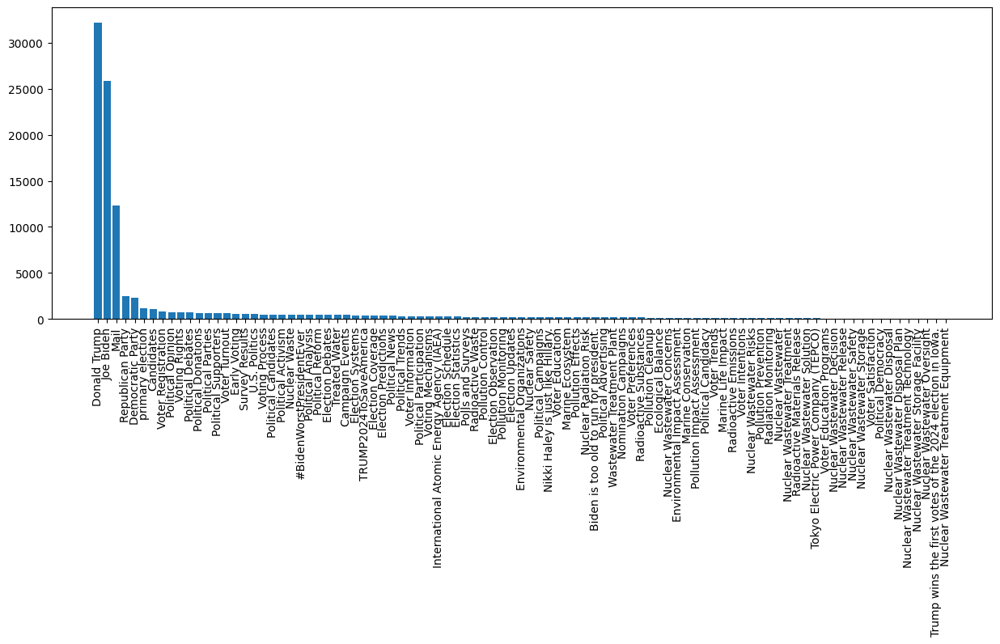

In [26]:
# 统计en_topic_dict
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter
plt.figure(figsize=(15, 5))
en_topic_count = Counter(en_topic_dict)
en_topic_count = dict(en_topic_count)
en_topic_count = dict(sorted(en_topic_count.items(), key=lambda item: item[1], reverse=True))
plt.bar(en_topic_count.keys(), en_topic_count.values())
plt.xticks(rotation=90)

In [85]:
# 保存模型
topic_model_en.save("en_model",serialization="pickle")
# loaded_model = BERTopic.load("my_model")


2024-02-24 00:20:38,994 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.
/home/jovyan/my-conda-envs/cp/lib/python3.9/site-packages/scipy/sparse/_index.py:145: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.



In [51]:
topic_model_en.reduce_topics(docs, nr_topics=100)

In [52]:
topic_model_en.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,35425,-1_the_and_to_in,"[the, and, to, in, of, is, for, trump, donald,...",[Donald Trump Jr. will be called back to the s...
1,0,17678,0_joe_biden_president_bidens,"[joe, biden, president, bidens, us, debt, hous...",[President Joe Biden says he “feels good” abou...
2,1,14508,1_donald_trump_former_trumps,"[donald, trump, former, trumps, his, case, jud...",[The judge presiding over Donald Trump’s crimi...
3,2,7378,2_republican_desantis_ron_gov,"[republican, desantis, ron, gov, 2024, florida...",[Former New Jersey Gov. Chris Christie is expe...
4,3,3642,3_china_chinese_xi_rt,"[china, chinese, xi, rt, hong, chinas, jinping...",[RT : MARK ALMOND: China's crackdown in Hong K...
...,...,...,...,...,...
95,94,13,94_kazakhstan_compete_six_candidates,"[kazakhstan, compete, six, candidates, preside...",[Six Candidates To Compete In Kazakhstan Presi...
96,95,13,95_h1b_6400_furloughs_rutgers,"[h1b, 6400, furloughs, rutgers, academic, 900,...","[After 900 layoffs and 6,400 furloughs, Rutger..."
97,96,12,96_est_begins_optin_slope,"[est, begins, optin, slope, round, 1242024, av...",[🏔️🏔️🏔️ A new round of WATER WALL has been cre...
98,97,11,97_philips_ceremonial_carry_duty,"[philips, ceremonial, carry, duty, queen, deat...",[Queen to carry out first major ceremonial dut...


In [53]:
import pandas as pd
topic_df = pd.DataFrame(topic_model_en.get_topic_info())

In [55]:
topic_df.iloc[50:]

,Topic,Count,Name,Representation,Representative_Docs
50,49,82,49_military_kelly_losers_chief,"[military, kelly, losers, chief, veterans, com...","[Donald Trump, former Commander in Chief, publ..."
51,50,77,50_tonight_fierce_backlash_eastern,"[tonight, fierce, backlash, eastern, stories, ...",[Two big stories on the tonight. Fierce backl...
52,51,77,51_marxist_theories_living_focused,"[marxist, theories, living, focused, explain, ...",[Experts explain what Donald Trump's proposed ...
53,52,72,52_int_preparations_icj_uyghuristan,"[int, preparations, icj, uyghuristan, begun, p...",[The Uyghuristan Republican Party have begun p...
54,53,70,53_ivana_wife_died_73,"[ivana, wife, died, 73, first, torso, tina, di...","[Ivana Trump, the first wife of Donald Trump, ..."
55,54,70,54_atlas_jeers_boos_flurry,"[atlas, jeers, boos, flurry, chants, graduatio...","[Dr. Scott Atlas, a former adviser to Presiden..."
56,55,70,55_tsx_midday_globe_stocks,"[tsx, midday, globe, stocks, mail, staples, co...",[At midday: TSX rises as energy stocks shine; ...
57,56,66,56_parlatore_timothy_team_leaving,"[parlatore, timothy, team, leaving, legal, pla...","[Timothy Parlatore, an attorney for Donald Tru..."
58,57,66,57_id_buildings_amazing_butif,"[id, buildings, amazing, butif, dumbocraps, vo...",[Voter ID - ID to enter public buildings Amazi...
59,58,61,58_nauta_walt_valet_postponed,"[nauta, walt, valet, postponed, hide, charged,...","[A court appearance for Walt Nauta, Donald Tru..."


In [88]:
topic_model_en.visualize_topics()

In [102]:
topic_model_en.visualize_hierarchy()

In [36]:
import pandas as pd
res = pd.DataFrame(topic_model_en.get_document_info(docs))
res.iloc[0]['Document']


'Disinformation is going to be incredibly widespread in the 2024 US presidential election.  explains that in the early stages especially, your ability to cause chaos requires you to disrupt only relatively small numbers of people.  '

In [38]:
selected_data = res[res['Topic'] == 0]

In [40]:
for idx, row in selected_data.iterrows():
    print(row['Document'])
    print()

Pl stop that old man, half dead brain guy to contest US Presidential election again. 

Tracking the 2024 U.S. Presidential Election   BREAKING POLLS SUMMARY  Bumbling Biden Tanking Badly  TRUMP Soaring Out of This World

Just like in a U.S. Presidential election, a few swing stakeholders hold the fate of the next twenty years in their hands. How the U.S. approaches these stakeholders will be critical to achieving our goals in the 21st century. IMO these stakeholders are Saudi Arabia and India.

If Biden's not a friend what is Trump then?  It's a tragic choice for the free world, that's what it is, this US presidential election.

…and Biden got more than 81 million votes, the most votes ever cast for a candidate in a U.S. Presidential election. 😉

American deep state's election rigging agents when the 82 years old Biden chokes on a donut and immediately dies: 

The USA hates itself so much we are going to have another Trump/Biden presidential election. WTF is wrong with us?  Fuck

The c

In [41]:
res

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,Disinformation is going to be incredibly wides...,-1,-1_the_and_to_in,"[the, and, to, in, of, is, for, trump, donald,...",[Donald Trump Jr. will be called back to the s...,the - and - to - in - of - is - for - trump - ...,0.000000,False
1,There are no credible news reports about the 2...,-1,-1_the_and_to_in,"[the, and, to, in, of, is, for, trump, donald,...",[Donald Trump Jr. will be called back to the s...,the - and - to - in - of - is - for - trump - ...,0.000000,False
2,The problem is that you then turn around and c...,-1,-1_the_and_to_in,"[the, and, to, in, of, is, for, trump, donald,...",[Donald Trump Jr. will be called back to the s...,the - and - to - in - of - is - for - trump - ...,0.000000,False
3,When was the last US Presidential election tha...,2,2_republican_desantis_ron_gov,"[republican, desantis, ron, gov, 2024, florida...",[Former New Jersey Gov. Chris Christie is expe...,republican - desantis - ron - gov - 2024 - flo...,1.000000,False
4,After former Pres. Trump won Iowa in convincin...,2,2_republican_desantis_ron_gov,"[republican, desantis, ron, gov, 2024, florida...",[Former New Jersey Gov. Chris Christie is expe...,republican - desantis - ron - gov - 2024 - flo...,0.521921,False
...,...,...,...,...,...,...,...,...
110450,BREAKING: A working group has been set up to e...,5,5_nuclear_waste_radioactive_wastewater,"[nuclear, waste, radioactive, wastewater, fuku...",[The IAEA has started conducting the first saf...,nuclear - waste - radioactive - wastewater - f...,1.000000,False
110451,She couldn't glow up if ate nuclear waste.,5,5_nuclear_waste_radioactive_wastewater,"[nuclear, waste, radioactive, wastewater, fuku...",[The IAEA has started conducting the first saf...,nuclear - waste - radioactive - wastewater - f...,1.000000,False
110452,Mine is nuclear energy! There’s a big misconce...,5,5_nuclear_waste_radioactive_wastewater,"[nuclear, waste, radioactive, wastewater, fuku...",[The IAEA has started conducting the first saf...,nuclear - waste - radioactive - wastewater - f...,1.000000,False
110453,Fatuous is only a virtue to the lower orders. ...,5,5_nuclear_waste_radioactive_wastewater,"[nuclear, waste, radioactive, wastewater, fuku...",[The IAEA has started conducting the first saf...,nuclear - waste - radioactive - wastewater - f...,1.000000,False


In [43]:
# 把res保存为csv
res.to_csv("en_topic.csv",index=False)